In [1]:
import networkx as nx
import pandas as pd
import numpy as np
import pylab as p
import matplotlib.pyplot as plt
import os

In [2]:
path = os.getcwd()

In [3]:
path

'/Users/garima/KG/Graphs/scholarKG'

In [4]:
# write all data in a new folderr KG20C
DATASET_PATH = path + '/KG20C'

In [5]:
# get the KG dataset and prepare the data in form of triples 
def prepare_graphdata(path):
    files = ['train.txt', 'valid.txt', 'test.txt']
    #files=['valid.txt']
    entities, relations = set(), set()
    edges = []
    triples=[]
    for f in files:
        file_path = os.path.join(path, f)
        to_read = open(file_path, 'r')
        for line in to_read.readlines():
            head, rel, tail = line.strip().split('\t')
            entities.add(head)
            entities.add(tail)
            relations.add(rel)
            edge=(head,tail)
            edges.append(edge)
            triples.append((head,rel,tail))
        to_read.close()
    return entities,relations,edges, triples

In [6]:
# get all the entities and relations 
entities, relations, edges, triples= prepare_graphdata(DATASET_PATH)

In [7]:
# print relations
relations

{'author_in_affiliation',
 'author_write_paper',
 'paper_cite_paper',
 'paper_in_domain',
 'paper_in_venue'}

In [8]:
# no of entities
len(entities)

16362

In [9]:
# no of edges
len(edges)

55607

In [10]:
# map the entities and relations to ids
entities_to_id = {x: i for (i, x) in enumerate(sorted(entities))}
relations_to_id = {x: i for (i, x) in enumerate(sorted(relations))}

In [11]:
# write the entity and relatiion id mapping to a dictionary
for (dic, f) in zip([entities_to_id, relations_to_id], ['ent_id', 'rel_id']):
    ff = open(os.path.join(DATASET_PATH,'kg20', f), 'w+')
    for (x, i) in dic.items():
        ff.write("{}\t{}\n".format(x, i))
    ff.close()

In [12]:
# create triples with id
triplesWithID=[]
edgesWithID=[]
files = ['train.txt', 'valid.txt', 'test.txt']
for f in files:
    file_path = os.path.join(DATASET_PATH, f)
    to_read = open(file_path, 'r')
    for line in to_read.readlines():
        head, rel, tail = line.strip().split('\t')    
        edge=(entities_to_id[head],entities_to_id[tail])
        edgesWithID.append(edge)
        triplesWithID.append((entities_to_id[head],rel,entities_to_id[tail]))
    to_read.close()

In [ ]:
# create a dataframe to keep the triples
triplesDf = pd.DataFrame(triplesWithID)
triplesDf.columns = ['e1', 'r', 'e2']

In [15]:
# create the Knowledge graph from triples
G = nx.DiGraph(directed=True)
# extract head
head = [i[0] for i in triplesWithID]

#extract relation
relations = [i[1] for i in triplesWithID]

# extract tail
tail = [i[2] for i in triplesWithID]


for i in range(len(relations)):
         G.add_weighted_edges_from([(head[i], tail[i], i)])
edge_labels= dict([((u,v), relations[d['weight']]) for u,v, d in G.edges(data=True)])

In [16]:
# the metadata about each entity is given in a file called all_entity_info in KG20C dataset
# map the entities to the attribute information
entity_info= pd.read_csv(DATASET_PATH +'/all_entity_info.txt', sep='\t')
entity_info.columns=['entity', 'name', 'type']

In [17]:
# create a mapping with entity information
entityId = pd.DataFrame(entities_to_id.items(), columns=['entity', 'entityID'])

In [18]:
entity_info.head()

,entity,name,type
0,7C7CAEED,On rank correlation in information retrieval e...,paper
1,7AEE29E3,The Voting Model for People Search,paper
2,7D68490B,Document clustering with committees,paper
3,7A488256,A comparison of indexing techniques for Japane...,paper
4,7D5CD2DF,Feature selection for ranking,paper


In [19]:
triplesDf.head()

,e1,r,e2
0,3877,author_in_affiliation,1915
1,1603,author_in_affiliation,229
2,12953,author_write_paper,10004
3,7398,author_write_paper,5957
4,11891,paper_cite_paper,4979


In [20]:
currentNode=3877

In [21]:

def create_subgraph(currentNode):
    sub_edges=[]
    sub_nodes=[]

    sub_nodes.append(currentNode)
    edgeList=list(G.edges(currentNode))
    for i in range(len(edgeList)):           
        sub_edges.append(edgeList[i])
    idx=0
    while idx<=11:
        # list the immediate nodes at distance of 1
        availablePath= list(G.successors(currentNode))
    
        
        # get the possible next nodes from the current nodes
        for i in range(len(availablePath)):
            if availablePath[i] not in sub_nodes:
                sub_nodes.append(int(availablePath[i]))
        
            if len(G.edges(int(availablePath[i])))!=0:
                edgeList=list(G.edges(int(availablePath[i])))
                for i in range(len(edgeList)):  
                    if edgeList[i] not in sub_edges:
                        sub_edges.append(edgeList[i])  
    
        if sub_nodes[idx]!=currentNode:
            currentNode = sub_nodes[idx]
        idx = (idx + 1) 
    return sub_edges, sub_nodes

In [22]:
sub_edges, sub_nodes= create_subgraph(currentNode)

In [23]:
len(sub_nodes)

12

In [24]:
# create a dataframe from edges and keep the relations
subDf = pd.DataFrame(sub_edges)

# get entity information and map to each node in subG - sub_nodes
# get the relations from triples for edges in subG - sub_edges

triplesDf.columns = ['e1', 'r', 'e2']
subDf.columns = ['e1', 'e2']
subGraphDf=pd.DataFrame()

subGraphDf = pd.merge(subDf,triplesDf, on=['e1', 'e2'], how='inner' )

# similarly find all the information and type of the node
subNodesDf = pd.DataFrame(sub_nodes)
subNodesDf.columns = ['entityID']

# extract only the entity information of the entities in suub graph
nodesInfo = pd.merge(subNodesDf,entityId, on=['entityID'], how='inner' )

# convert intto string for all the values to be similar data type
nodesInfo['entityID']=nodesInfo['entityID'].astype(str)

# map the entity is to entity info (meta data)
nodesInfoG = pd.merge(nodesInfo,entity_info, on=['entity'], how='inner' )

In [25]:
nodesInfoG.head()

,entityID,entity,name,type
0,3877,28674CFA,amanda spink,author
1,1915,075CFC38,university of north texas,affiliation
2,6572,78D3F0A3,Term relevance feedback and query expansion: r...,paper
3,2330,0911786B,Mutual information,domain
4,387,0160D514,Information retrieval,domain



 Knowledge Graph generated


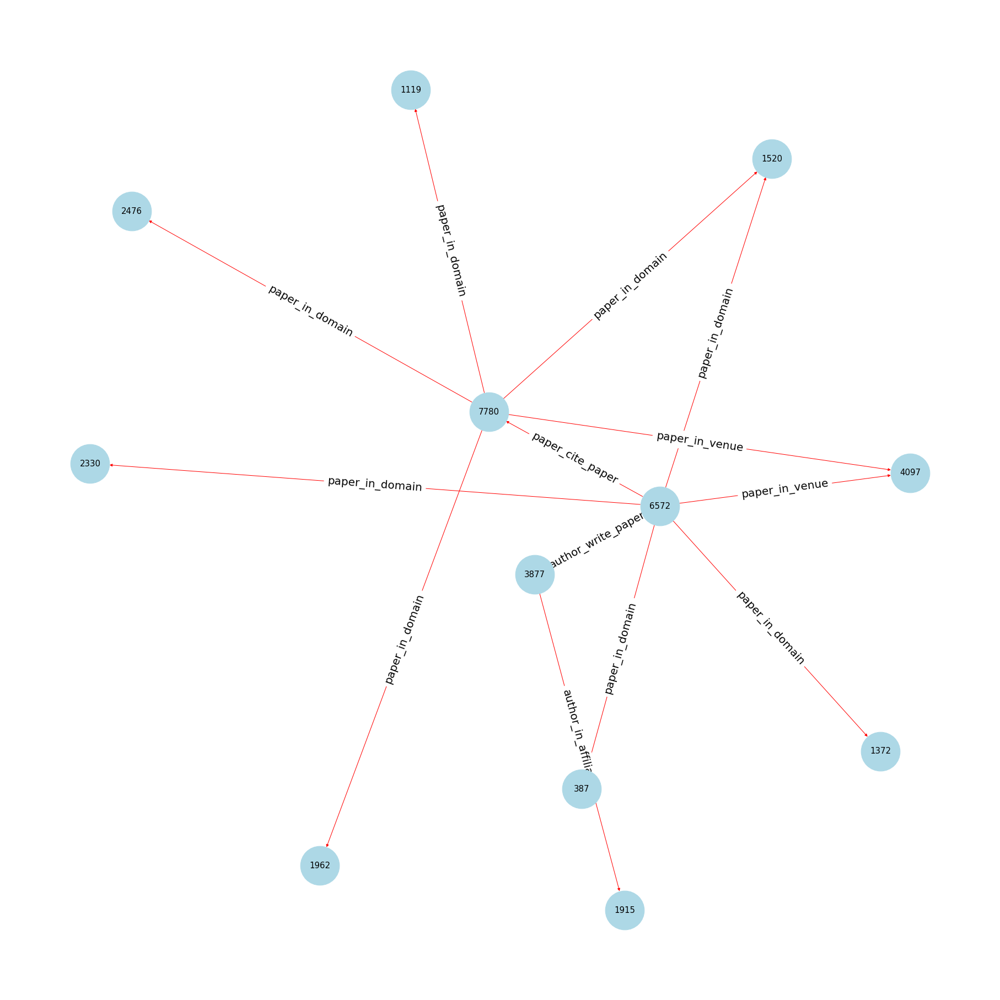

In [26]:
# plot the subgraph

# extract head
head = subGraphDf['e1']

#extract relation
relations = subGraphDf['r']

# extract tail
tail = subGraphDf['e2']

sG = nx.DiGraph(directed=True)  
for i in range(len(relations)):
    sG.add_weighted_edges_from([(head[i], tail[i], i)])
    
print("\n Knowledge Graph generated")
size =25
if (len(relations)/2)>20:
    size= len(edge)/2
plt.figure(figsize=(size, size))
edge_labels= dict([((u,v), relations[d['weight']]) for u,v, d in sG.edges(data=True)])
pos=nx.spring_layout(sG,k=0.8)
nx.draw(sG, with_labels=True, node_color='lightblue', node_size=5000, edge_color='r', edge_cmap=plt.cm.Blues, pos=pos, font_size=15)
nx.draw_networkx_edge_labels(sG, pos, edge_labels= edge_labels, font_size=20)
plt.savefig('subGraph_3877.png')

## Function to initialize Node Price

In [28]:
import random
def intial_price(initialVal):
    nodePrice={}
    
    for key in sub_nodes:
        if initialVal==0:
            # assign initial price as 0 for all the nodes
            nodePrice[key] =0
        else:
            # choose random
            nodePrice[key] = random.randrange(100, 1000, 10)
    return nodePrice

## Function to initialize Arc Weights

In [81]:
import random
def arc_weights(initialVal):
    edgeWeight={}
    
    for key in sub_edges:
        if initialVal==0:
            # assign initial price as 0 for all the nodes
            edgeWeight[key] =0
        else:
            # choose random
            edgeWeight[key] = initialVal
    return edgeWeight

## Function to add minimum price node to the Path

In [82]:
def getMinPriceSuccNode(kNode,Path):
     # list the immediate nodes at distance of 1
    
                
    availablePath = list(G.successors(int(kNode)))
    
    
    availablepathPrice = {}
        # get the price of all the nodes in available path 
    for (key, value) in nodePrice.items():
        for i in range(len(availablePath)):
            if key == availablePath[i]:
                availablepathPrice[key]= value
    
    print("the price of available nodes is:", availablepathPrice)

    availableWeights={}
    
    # get the weights of arcs from kNode to nodes in availablePath
    
    for (key, value) in edgeWeight.items():
        for i in range(len(availablePath)):
            if key == (kNode, availablePath[i]):
                availableWeights[key]=value
    
    print("the weights of available edges is:", availableWeights)
    
    

        # find the minimum price and the node
    
    choseNode = {k:v for k, v in availablepathPrice.items() if k not in highpriceNode }
    print("\nThe new nodes chosen are:",choseNode)  
    
    # get the corresponding weights for min price edge from kNode and add to prices of chosenNode
    
    chosenPriceWeights = {}
    for node in choseNode:
        weightkChose = [val for key, val in availableWeights.items() if int(node) in key]
        weight = [int(item) for item in weightkChose]
        choseNode[node] = choseNode[node] + weight[0]
    else:
        pass


    print("\nThe new prices of chosen are:",choseNode) 
    # find the node with minimum price
    if choseNode != {}:
        minPrice = min(choseNode.values()) 
        minNode = [k for k, v in choseNode.items() if v==minPrice]
        print("\nThe new min node chosen is:",minNode)  
        succNode = minNode[0]
        print("The successor node is:",succNode )
        
    else:
        if kNode==source:
            succNode=kNode
            print("reached source, no path available")
        else:
            nodePrice[kNode]= 1000000
            highpriceNode.append(kNode)
            Path=Path[:-1]
            pathLength=len(Path)
            kNode = Path[pathLength-1] 
            kNode, succNode,Path=getMinPriceSuccNode(kNode,Path)
                
    return kNode, succNode,Path

## Function to update price as per maximum price rise

In [ ]:
def update_price_maximum_price_rise(Path):
    reached_targets=[]
    j=0
    i=1
    while True:
        pathLength=len(Path)
        if pathLength!=0:
            kNode = Path[pathLength-1]
            
            kPath = list(G.successors(kNode))
            if len(kPath)==0 and kNode !=source:
                nodePrice[kNode]= 1000000
                highpriceNode.append(kNode)
                print("Terminal node reached, set the price to infinity and contract - remove the node")
                Path=Path[:-1]
                print("The new path is", Path)
                pathLength=len(Path)
                kNode = Path[pathLength-1]    
                
            
            kNode,succNode, Path = getMinPriceSuccNode(kNode, Path)
            if succNode==kNode and pathLength==1:
                print("The destination reached are", *reached_targets) 
                print("The number of steps", i)
                break
                
        print("The path is:", Path)
        print("The current K node is:", kNode)
        print("The succ node is:", succNode)
        
        pathLength=len(Path)
        
        
            
        if pathLength<2 and kNode==source:
            nodePrice[kNode]=max(nodePrice[kNode],edgeWeight[(kNode,succNode)]+ nodePrice[succNode]+1)
            Path.append(succNode)
            print("Downhill Extend path to succ node and update the price of k")
            print("\nThe latest price is:", nodePrice)  
            print("\nThe latest path is:", Path)
            if succNode in target:
                reached_targets.append(succNode)
                j=j+1
                target.remove(succNode)
                print("Path to {} th target is: {}".format(j, Path))
                print("The destination reached are", *reached_targets) 
            #draw_color(Path)
            
        elif pathLength>=2:
            predNode = Path[pathLength-2]  
       
        
             # check prices
                                 
            # 1. downhill - Extend P to succ(k) and set price of k to price of pred(k)
            if nodePrice[succNode]<nodePrice[kNode]:
                print("Downhill Extend path to succ node and set the price of k to pred node")
                nodePrice[kNode]=nodePrice[predNode]-edgeWeight[(predNode,kNode)]
                Path.append(succNode)
                print("\nThe latest price is:", nodePrice)  
                print("\nThe latest path is:", Path)
                 # find target only on extension
                if succNode in target:
                    reached_targets.append(succNode)
                    j=j+1
                    target.remove(succNode)
                    print("Path to {} th target is: {}".format(j, Path))
                print("The destination reached are", *reached_targets) 
                #draw_color(Path)
                
            # 2. uphill - contract path and raise the price of k to the succ(k)+1
            elif nodePrice[succNode] > nodePrice[kNode]:
                print("\n Uphill- contract and update the price")
                nodePrice[kNode]=edgeWeight[(kNode,succNode)]+ nodePrice[succNode]+1
                print("\nThe updated price is:", nodePrice)  
                print("\nRemoving the high price node:", kNode)
                Path=Path[:-1]
                print("The updated Path is:", Path)
        
             # 3. level - has 2 conditions to avoid the loop
            elif nodePrice[kNode] == nodePrice[succNode]:
                if succNode==kNode:
                    break
                # 3.a if pred(k) has higher price than k - extend to succ(k) and raise price of k to pred(k)
                if nodePrice[predNode] > nodePrice[kNode] :
                    print("\nsame level Case 1 - Extend to succ node and update the price of k to pred node")
                    nodePrice[kNode]=nodePrice[predNode]- edgeWeight[(predNode,kNode)]
                    print("\nThe updated price is:", nodePrice) 
                    Path.append(succNode)
                    print("The updated Path is:", Path)
                    print("\nThe updated price is:", nodePrice) 
                    # find target only on extension
                    if succNode in target:
                        reached_targets.append(succNode)
                        j=j+1
                        target.remove(succNode)
                        print("Path to {} th target is: {}".format(j, Path))
                        print("The destination reached are", *reached_targets) 
                    #draw_color(Path)
            
                # 3.b if price of pred(k) is same as k
                elif (nodePrice[predNode] == nodePrice[kNode]):
                    print("\nsame level Case 2- Contract, remove the node and update the price")
                    nodePrice[kNode]=nodePrice[kNode]+1
                    print("\nRemoving the high price node:", kNode)
                    print("\nThe updated price is:", nodePrice) 
                    Path=Path[:-1]
                    print("The updated Path is:", Path) 
                    
                
                
        i=i+1  
         
        
        if target == []:
            print("all destination reached")
            print("\nThe path is:", Path)
            print("The price of each node is:", nodePrice)
            print("The high price nodes:",highpriceNode )
            print("The number of steps", i)
            print("The destination reached are", *reached_targets)
           # draw_color(Path)
            break
    return Path    

## Function to construct forward path as per Price and Arc Weights for Single Destination

In [83]:
def update_price_single(Path):
    
    
    i=1
    while True:
        pathLength=len(Path)
        if pathLength!=0:
            kNode = Path[pathLength-1]
            
            kPath = list(G.successors(kNode))
            if len(kPath)==0 and kNode !=source:
                nodePrice[kNode]= 1000000
                highpriceNode.append(kNode)
                print("Terminal node reached, set the price to infinity and contract - remove the node")
                Path=Path[:-1]
                print("The new path is", Path)
                pathLength=len(Path)
                kNode = Path[pathLength-1]    
                
            
            kNode,succNode, Path = getMinPriceSuccNode(kNode, Path)
            if succNode==kNode and pathLength==1: 
                print("The final path is", Path)
                print("The number of steps", i)
                break
                
        print("The path is:", Path)
        print("The current K node is:", kNode)
        print("The succ node is:", succNode)
        
        pathLength=len(Path)
        
        
            
        if pathLength<2 and kNode==source:
            
            nodePrice[kNode]=max(nodePrice[kNode],edgeWeight[(kNode,succNode)]+nodePrice[succNode]+1)
            Path.append(succNode)
            print("Downhill Extend path to succ node and update the price of k")
            print("\nThe latest price is:", nodePrice)  
            print("\nThe latest path is:", Path)
             #find target only on extension
            if succNode == target:
                print("Path to target is: {}".format(Path))
                print("The number of steps", i)
                break
            
            
        elif pathLength>=2:
            predNode = Path[pathLength-2]  
       
        
             # check prices
                                 
            # 1. downhill - Extend P to succ(k) and set price of k to price of pred(k)
            if nodePrice[succNode]<nodePrice[kNode]:
                print("Downhill Extend path to succ node and set the price of k to pred node")
                nodePrice[kNode]=nodePrice[predNode]-edgeWeight[(predNode,kNode)]
                Path.append(succNode)
                print("\nThe latest price is:", nodePrice)  
                print("\nThe latest path is:", Path)
                 #find target only on extension
                if succNode == target:
                    print("Path to target is: {}".format(Path))
                    print("The number of steps", i)
                    break
               
                
            # 2. uphill - contract path and raise the price of k to the succ(k)+1
            elif nodePrice[succNode] > nodePrice[kNode]:
                print("\n Uphill- contract and update the price")
                nodePrice[kNode]=edgeWeight[(kNode,succNode)]+nodePrice[succNode]+1
                print("\nThe updated price is:", nodePrice) 
                print("\nRemoving the high price node:", kNode)
                Path=Path[:-1]

        
             # 3. level - has 2 conditions to avoid the loop
            elif nodePrice[kNode] == nodePrice[succNode]:
             
                # 3.a if pred(k) has higher price than k - extend to succ(k) and raise price of k to pred(k)
                if nodePrice[predNode] > nodePrice[kNode] :
                    print("\nsame level Case 1 - Extend to succ node and update the price of k to pred node")
                    nodePrice[kNode]=nodePrice[predNode]- edgeWeight[(predNode,kNode)]
                    print("\nThe updated price is:", nodePrice) 
                    Path.append(succNode)
                    print("The updated Path is:", Path)
                    print("\nThe updated price is:", nodePrice) 
                    #find target only on extension
                    if succNode == target:
                        print("Path to target is: {}".format(Path))
                        print("The number of steps", i)
                        break
            
                # 3.b if price of pred(k) is same as k
                elif (nodePrice[predNode] == nodePrice[kNode]):
                    print("\nsame level Case 2- Contract, remove the node and update the price")
                    nodePrice[kNode]=nodePrice[kNode]+1
                    Path=Path[:-1]

                    
                                        
                
        i=i+1  
        
    return Path

## Function to Construct Forward Path for multiple destinations

In [84]:
def update_price_multiple(Path):
    reached_targets=[]
    j=0
    i=1
    while True:
        pathLength=len(Path)
        if pathLength!=0:
            kNode = Path[pathLength-1]
            
            kPath = list(G.successors(kNode))
            if len(kPath)==0 and kNode !=source:
                nodePrice[kNode]= 1000000
                highpriceNode.append(kNode)
                print("Terminal node reached, set the price to infinity and contract - remove the node")
                Path=Path[:-1]
                print("The new path is", Path)
                pathLength=len(Path)
                kNode = Path[pathLength-1]    
                
            
            kNode,succNode, Path = getMinPriceSuccNode(kNode, Path)
            if succNode==kNode and pathLength==1:
                print("The destination reached are", *reached_targets) 
                print("The number of steps", i)
                break
                
        print("The path is:", Path)
        print("The current K node is:", kNode)
        print("The succ node is:", succNode)
        
        pathLength=len(Path)
        
        
            
        if pathLength<2 and kNode==source:
            nodePrice[kNode]=max(nodePrice[kNode],edgeWeight[(kNode,succNode)]+ nodePrice[succNode]+1)
            Path.append(succNode)
            print("Downhill Extend path to succ node and update the price of k")
            print("\nThe latest price is:", nodePrice)  
            print("\nThe latest path is:", Path)
            if succNode in target:
                reached_targets.append(succNode)
                j=j+1
                target.remove(succNode)
                print("Path to {} th target is: {}".format(j, Path))
                print("The destination reached are", *reached_targets) 
            #draw_color(Path)
            
        elif pathLength>=2:
            predNode = Path[pathLength-2]  
       
        
             # check prices
                                 
            # 1. downhill - Extend P to succ(k) and set price of k to price of pred(k)
            if nodePrice[succNode]<nodePrice[kNode]:
                print("Downhill Extend path to succ node and set the price of k to pred node")
                nodePrice[kNode]=nodePrice[predNode]-edgeWeight[(predNode,kNode)]
                Path.append(succNode)
                print("\nThe latest price is:", nodePrice)  
                print("\nThe latest path is:", Path)
                 # find target only on extension
                if succNode in target:
                    reached_targets.append(succNode)
                    j=j+1
                    target.remove(succNode)
                    print("Path to {} th target is: {}".format(j, Path))
                print("The destination reached are", *reached_targets) 
                #draw_color(Path)
                
            # 2. uphill - contract path and raise the price of k to the succ(k)+1
            elif nodePrice[succNode] > nodePrice[kNode]:
                print("\n Uphill- contract and update the price")
                nodePrice[kNode]=edgeWeight[(kNode,succNode)]+ nodePrice[succNode]+1
                print("\nThe updated price is:", nodePrice)  
                print("\nRemoving the high price node:", kNode)
                Path=Path[:-1]
                print("The updated Path is:", Path)
        
             # 3. level - has 2 conditions to avoid the loop
            elif nodePrice[kNode] == nodePrice[succNode]:
                if succNode==kNode:
                    break
                # 3.a if pred(k) has higher price than k - extend to succ(k) and raise price of k to pred(k)
                if nodePrice[predNode] > nodePrice[kNode] :
                    print("\nsame level Case 1 - Extend to succ node and update the price of k to pred node")
                    nodePrice[kNode]=nodePrice[predNode]- edgeWeight[(predNode,kNode)]
                    print("\nThe updated price is:", nodePrice) 
                    Path.append(succNode)
                    print("The updated Path is:", Path)
                    print("\nThe updated price is:", nodePrice) 
                    # find target only on extension
                    if succNode in target:
                        reached_targets.append(succNode)
                        j=j+1
                        target.remove(succNode)
                        print("Path to {} th target is: {}".format(j, Path))
                        print("The destination reached are", *reached_targets) 
                    #draw_color(Path)
            
                # 3.b if price of pred(k) is same as k
                elif (nodePrice[predNode] == nodePrice[kNode]):
                    print("\nsame level Case 2- Contract, remove the node and update the price")
                    nodePrice[kNode]=nodePrice[kNode]+1
                    print("\nRemoving the high price node:", kNode)
                    print("\nThe updated price is:", nodePrice) 
                    Path=Path[:-1]
                    print("The updated Path is:", Path) 
                    
                
                
        i=i+1  
         
        
        if target == []:
            print("all destination reached")
            print("\nThe path is:", Path)
            print("The price of each node is:", nodePrice)
            print("The high price nodes:",highpriceNode )
            print("The number of steps", i)
            print("The destination reached are", *reached_targets)
           # draw_color(Path)
            break
    return Path    

## Experiments

## Case 1.a :  Single Destination with intial price as '0'

In [100]:
#query = " if author Amanda has a paper in SIGR conference"

source = int("3877")
target= int("4097")


# keep a track of current nodes| Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]

In [101]:
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(0)

In [102]:
Pathfound=update_price_single(Path)

the price of available nodes is: {1915: 0, 6572: 0}
the weights of available edges is: {(3877, 1915): 0, (3877, 6572): 0}

The new nodes chosen are: {1915: 0, 6572: 0}

The new prices of chosen are: {1915: 0, 6572: 0}

The new min node chosen is: [1915, 6572]
The successor node is: 1915
The path is: [3877]
The current K node is: 3877
The succ node is: 1915
Downhill Extend path to succ node and update the price of k

The latest price is: {3877: 1, 1915: 0, 6572: 0, 2330: 0, 387: 0, 1520: 0, 4097: 0, 1372: 0, 7780: 0, 2476: 0, 1119: 0, 1962: 0}

The latest path is: [3877, 1915]
Terminal node reached, set the price to infinity and contract - remove the node
The new path is [3877]
the price of available nodes is: {1915: 1000000, 6572: 0}
the weights of available edges is: {(3877, 1915): 0, (3877, 6572): 0}

The new nodes chosen are: {6572: 0}

The new prices of chosen are: {6572: 0}

The new min node chosen is: [6572]
The successor node is: 6572
The path is: [3877]
The current K node is: 3

In [289]:
nodesInfoG[nodesInfoG['entityID']=='1119']

,entityID,entity,name,type
10,1119,04625E4E,Cluster analysis,domain


In [167]:
# map the entities to type and get the query result

In [114]:
def map_path_to_entity_types(pathFound):
    
    entityName=[]
    entityType=[]
    
    for i in range(len(pathFound)):
        entityName.append(nodesInfoG[nodesInfoG['entityID']==pathFound[i]]['name'].values[0])
        entityType.append(nodesInfoG[nodesInfoG['entityID']==pathFound[i]]['type'].values[0])
          
    return entityName, entityType

In [225]:
#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the function on path found for target 1119
name, etype = map_path_to_entity_types(Pathfound)

In [226]:
name

['amanda spink',
 'Term relevance feedback and query expansion: relation to design',
 'SIGIR']

In [227]:
etype

['author', 'paper', 'conference']

## Case 1.b Single Destination with arbitrary initial price 

In [103]:
# query = " if author Amanda 's paper was cited in Cluster Analysis domain"
source = int("3877")
target= int("1119")


# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]

# initialize random price
nodePrice = intial_price(100)
edgeWeight= arc_weights(0)

In [104]:
Pathfound=update_price_single(Path)

the price of available nodes is: {1915: 840, 6572: 500}
the weights of available edges is: {(3877, 1915): 0, (3877, 6572): 0}

The new nodes chosen are: {1915: 840, 6572: 500}

The new prices of chosen are: {1915: 840, 6572: 500}

The new min node chosen is: [6572]
The successor node is: 6572
The path is: [3877]
The current K node is: 3877
The succ node is: 6572
Downhill Extend path to succ node and update the price of k

The latest price is: {3877: 501, 1915: 840, 6572: 500, 2330: 160, 387: 900, 1520: 140, 4097: 680, 1372: 640, 7780: 360, 2476: 110, 1119: 940, 1962: 890}

The latest path is: [3877, 6572]
the price of available nodes is: {2330: 160, 387: 900, 1520: 140, 4097: 680, 1372: 640, 7780: 360}
the weights of available edges is: {(6572, 2330): 0, (6572, 387): 0, (6572, 1520): 0, (6572, 4097): 0, (6572, 1372): 0, (6572, 7780): 0}

The new nodes chosen are: {2330: 160, 387: 900, 1520: 140, 4097: 680, 1372: 640, 7780: 360}

The new prices of chosen are: {2330: 160, 387: 900, 1520:

In [235]:
#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the function on path found for target 1119
name, etype = map_path_to_entity_types(Pathfound)

In [236]:
name

['amanda spink',
 'Term relevance feedback and query expansion: relation to design',
 'A user-centred evaluation of ranking algorithms for interactive query expansion',
 'Cluster analysis']

In [237]:
etype

['author', 'paper', 'paper', 'domain']

In [ ]:
# query = " if author Amanda 's paper was cited in Cluster Analysis "
#source = "amanda spink", target = "cluster analysis"

# corrresponding entityID for these entities are 3877 and 1119
# Path to target is: [3877, 6572, 7780, 1119]
#extract relations between these entities from triples table
# result = "Amanda spink, author_write_paper , 'Term relevance feedback and query expansion: relation to design'
# 'paper_cite_paper' 'A user-centred evaluation of ranking algorithms for interactive query expansion'
# paper_in_domain 'Cluster analysis'
# interpret as : "Amanda spink is author of 'Term relevance feedback and query expansion: relation to design'
# which cites a paper 'A user-centred evaluation of ranking algorithms for interactive query expansion'
# with domain 'Cluster analysis'

## Case 1.c : reusing prices from previous run for different destination

In [327]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [105]:
# query = " if author Amanda 's paper has a paper in Vector Space domain"
source = int("3877")
target= int("1372")


# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
edgeWeight= arc_weights(0)

In [106]:
Pathfound=update_price_single(Path)

the price of available nodes is: {1915: 1000000, 6572: 943}
the weights of available edges is: {(3877, 1915): 0, (3877, 6572): 0}

The new nodes chosen are: {1915: 1000000, 6572: 943}

The new prices of chosen are: {1915: 1000000, 6572: 943}

The new min node chosen is: [6572]
The successor node is: 6572
The path is: [3877]
The current K node is: 3877
The succ node is: 6572
Downhill Extend path to succ node and update the price of k

The latest price is: {3877: 944, 1915: 1000000, 6572: 943, 2330: 1000000, 387: 1000000, 1520: 1000000, 4097: 1000000, 1372: 1000000, 7780: 943, 2476: 1000000, 1119: 940, 1962: 1000000}

The latest path is: [3877, 6572]
the price of available nodes is: {2330: 1000000, 387: 1000000, 1520: 1000000, 4097: 1000000, 1372: 1000000, 7780: 943}
the weights of available edges is: {(6572, 2330): 0, (6572, 387): 0, (6572, 1520): 0, (6572, 4097): 0, (6572, 1372): 0, (6572, 7780): 0}

The new nodes chosen are: {2330: 1000000, 387: 1000000, 1520: 1000000, 4097: 1000000, 

In [244]:
#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the function on path found for target 1119
name, etype = map_path_to_entity_types(Pathfound)

In [245]:
name

['amanda spink',
 'Term relevance feedback and query expansion: relation to design',
 'Vector space model']

In [246]:
etype

['author', 'paper', 'domain']

## Case 2.a : Finding path for a query with single source and Multiple Destinations
### initial price '0'

In [107]:
source = int("3877")

# multiple targets
target=["2330","1962"]

# keep a track of current nodes| Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
target = [int(x) for x in target]

# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(0)

In [108]:
Pathfound = update_price_multiple(Path)

the price of available nodes is: {1915: 0, 6572: 0}
the weights of available edges is: {(3877, 1915): 0, (3877, 6572): 0}

The new nodes chosen are: {1915: 0, 6572: 0}

The new prices of chosen are: {1915: 0, 6572: 0}

The new min node chosen is: [1915, 6572]
The successor node is: 1915
The path is: [3877]
The current K node is: 3877
The succ node is: 1915
Downhill Extend path to succ node and update the price of k

The latest price is: {3877: 1, 1915: 0, 6572: 0, 2330: 0, 387: 0, 1520: 0, 4097: 0, 1372: 0, 7780: 0, 2476: 0, 1119: 0, 1962: 0}

The latest path is: [3877, 1915]
Terminal node reached, set the price to infinity and contract - remove the node
The new path is [3877]
the price of available nodes is: {1915: 1000000, 6572: 0}
the weights of available edges is: {(3877, 1915): 0, (3877, 6572): 0}

The new nodes chosen are: {6572: 0}

The new prices of chosen are: {6572: 0}

The new min node chosen is: [6572]
The successor node is: 6572
The path is: [3877]
The current K node is: 3

In [254]:
#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the function on path found for target 1119
name, etype = map_path_to_entity_types(Pathfound)

In [255]:
name

['amanda spink',
 'Term relevance feedback and query expansion: relation to design',
 'A user-centred evaluation of ranking algorithms for interactive query expansion',
 'Delegation']

In [261]:
pathFirst = [3877, 6572, 2330]
pathFirst=[str(i) for i in pathFirst]
name, etype = map_path_to_entity_types(pathFirst)

In [262]:
name

['amanda spink',
 'Term relevance feedback and query expansion: relation to design',
 'Mutual information']

## Case 2.b Path from single source to multiple destinations 
### with arbitrary initial prices between 100 to 1000

In [109]:
source = int("3877")

# multiple targets
target=["387","2476", "1119"]

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
target = [int(x) for x in target]

# initialize random price between 100 to 1000
nodePrice = intial_price(100)
edgeWeight= arc_weights(0)

In [110]:
Pathfound = update_price_multiple(Path)

the price of available nodes is: {1915: 360, 6572: 340}
the weights of available edges is: {(3877, 1915): 0, (3877, 6572): 0}

The new nodes chosen are: {1915: 360, 6572: 340}

The new prices of chosen are: {1915: 360, 6572: 340}

The new min node chosen is: [6572]
The successor node is: 6572
The path is: [3877]
The current K node is: 3877
The succ node is: 6572
Downhill Extend path to succ node and update the price of k

The latest price is: {3877: 870, 1915: 360, 6572: 340, 2330: 620, 387: 540, 1520: 580, 4097: 370, 1372: 110, 7780: 100, 2476: 900, 1119: 410, 1962: 960}

The latest path is: [3877, 6572]
the price of available nodes is: {2330: 620, 387: 540, 1520: 580, 4097: 370, 1372: 110, 7780: 100}
the weights of available edges is: {(6572, 2330): 0, (6572, 387): 0, (6572, 1520): 0, (6572, 4097): 0, (6572, 1372): 0, (6572, 7780): 0}

The new nodes chosen are: {2330: 620, 387: 540, 1520: 580, 4097: 370, 1372: 110, 7780: 100}

The new prices of chosen are: {2330: 620, 387: 540, 1520:

In [271]:
#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the function on path found for target 1119
name, etype = map_path_to_entity_types(Pathfound)

In [272]:
name

['amanda spink',
 'Term relevance feedback and query expansion: relation to design',
 'A user-centred evaluation of ranking algorithms for interactive query expansion',
 'Hypertext']

In [277]:
pathSec= [3877, 6572, 7780, 1119]
pathFirst = [3877, 6572, 387]
pathFirst=[str(i) for i in pathFirst]
fname, fetype = map_path_to_entity_types(pathFirst)
pathSec=[str(i) for i in pathSec]
sname, setype = map_path_to_entity_types(pathSec)

In [278]:
fname

['amanda spink',
 'Term relevance feedback and query expansion: relation to design',
 'Information retrieval']

In [279]:
sname

['amanda spink',
 'Term relevance feedback and query expansion: relation to design',
 'A user-centred evaluation of ranking algorithms for interactive query expansion',
 'Cluster analysis']

## Case 2.c Reusing prices from previous run for different destinations

In [ ]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [111]:
# reuse prices for different destination
source = int("3877")

# multiple targets
target=["1372", "1915"]

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
target = [int(x) for x in target]
edgeWeight= arc_weights(0)

In [112]:
Pathfound = update_price_multiple(Path)

the price of available nodes is: {1915: 1000000, 6572: 903}
the weights of available edges is: {(3877, 1915): 0, (3877, 6572): 0}

The new nodes chosen are: {1915: 1000000, 6572: 903}

The new prices of chosen are: {1915: 1000000, 6572: 903}

The new min node chosen is: [6572]
The successor node is: 6572
The path is: [3877]
The current K node is: 3877
The succ node is: 6572
Downhill Extend path to succ node and update the price of k

The latest price is: {3877: 904, 1915: 1000000, 6572: 903, 2330: 1000000, 387: 1000000, 1520: 1000000, 4097: 1000000, 1372: 1000000, 7780: 903, 2476: 900, 1119: 1000000, 1962: 960}

The latest path is: [3877, 6572]
the price of available nodes is: {2330: 1000000, 387: 1000000, 1520: 1000000, 4097: 1000000, 1372: 1000000, 7780: 903}
the weights of available edges is: {(6572, 2330): 0, (6572, 387): 0, (6572, 1520): 0, (6572, 4097): 0, (6572, 1372): 0, (6572, 7780): 0}

The new nodes chosen are: {2330: 1000000, 387: 1000000, 1520: 1000000, 4097: 1000000, 1372

In [340]:
# interpret the query results
pathFirst = [3877, 1915]
pathFirst=[str(i) for i in pathFirst]
fname, fetype = map_path_to_entity_types(pathFirst)
#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the function on path found for target 1119
name, etype = map_path_to_entity_types(Pathfound)

In [341]:
fname

['amanda spink', 'university of north texas']

In [342]:
name

['amanda spink',
 'Term relevance feedback and query expansion: relation to design',
 'Vector space model']

## More Experiments with Subgraph 2

In [113]:
# create the subgraph
currentNode=12953
sub_edges, sub_nodes= create_subgraph(currentNode)

In [114]:
len(sub_nodes)

49

In [115]:
# create a dataframe from edges and keep the relations
subDf = pd.DataFrame(sub_edges)

# get entity information and map to each node in subG - sub_nodes
# get the relations from triples for edges in subG - sub_edges

triplesDf.columns = ['e1', 'r', 'e2']
subDf.columns = ['e1', 'e2']
subGraphDf=pd.DataFrame()

subGraphDf = pd.merge(subDf,triplesDf, on=['e1', 'e2'], how='inner' )

# similarly find all the information and type of the node
subNodesDf = pd.DataFrame(sub_nodes)
subNodesDf.columns = ['entityID']

# extract only the entity information of the entities in suub graph
nodesInfo = pd.merge(subNodesDf,entityId, on=['entityID'], how='inner' )

# convert intto string for all the values to be similar data type
nodesInfo['entityID']=nodesInfo['entityID'].astype(str)

# map the entity is to entity info (meta data)
nodesInfoG = pd.merge(nodesInfo,entity_info, on=['entity'], how='inner' )

In [116]:
# plot the subgraph

# extract head
head = subGraphDf['e1']

#extract relation
relations = subGraphDf['r']

# extract tail
tail = subGraphDf['e2']

sG = nx.DiGraph(directed=True)  
for i in range(len(relations)):
    sG.add_weighted_edges_from([(head[i], tail[i], i)])
    
print("\n Knowledge Graph generated")
size =200
if (len(relations)/2)>200:
    size= len(edge)/2
plt.figure(figsize=(size, size))
edge_labels= dict([((u,v), relations[d['weight']]) for u,v, d in sG.edges(data=True)])
pos=nx.spring_layout(sG,k=0.8)
nx.draw(sG, with_labels=True, node_color='lightblue', node_size=5000, edge_color='r', edge_cmap=plt.cm.Blues, pos=pos, font_size=15)
nx.draw_networkx_edge_labels(sG, pos, edge_labels= edge_labels, font_size=20)
plt.savefig('subGraph_12953.png')


 Knowledge Graph generated


In [78]:
nodesInfoG.head(20)

,entityID,entity,name,type
0,12953,8032D24C,mehryar mohri,author
1,10004,7E3C8A87,Magnitude-preserving ranking algorithms,paper
2,588,022F9467,courant institute of mathematical sciences,affiliation
3,13235,8063F457,On sampling-based approximate spectral decompo...,paper
4,4459,5A788322,Positive Definite Rational Kernels,paper
5,11358,7F1EA2EA,Generalized algorithms for constructing statis...,paper
6,4272,4F872588,at t labs,affiliation
7,5227,73E5EC11,Two-Stage Learning Kernel Algorithms,paper
8,10183,7E5E291E,AUC Optimization vs. Error Rate Minimization,paper
9,11026,7EE36B30,Confidence Intervals for the Area Under the RO...,paper


## Case 1.a Single destination - initial price 0

In [119]:
# apply path finding algorithm
# provide the source and destination

source = int("12953")
target= int("4906")

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(0)

In [120]:
Pathfound=update_price_single(Path)

the price of available nodes is: {10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0}
the weights of available edges is: {(12953, 10004): 0, (12953, 588): 0, (12953, 13235): 0, (12953, 4459): 0, (12953, 11358): 0, (12953, 4272): 0, (12953, 5227): 0, (12953, 10183): 0, (12953, 11026): 0}

The new nodes chosen are: {10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0}

The new prices of chosen are: {10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0}

The new min node chosen is: [10004, 588, 13235, 4459, 11358, 4272, 5227, 10183, 11026]
The successor node is: 10004
The path is: [12953]
The current K node is: 12953
The succ node is: 10004
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 1, 10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0

In [398]:
#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the function on path found 
name, etype = map_path_to_entity_types(Pathfound)

In [399]:
name

['mehryar mohri',
 'Magnitude-preserving ranking algorithms',
 'Subset ranking using regression']

In [400]:
etype 

['author', 'paper', 'paper']

In [403]:
subGraphDf.head(30)

,e1,e2,r
0,12953,10004,author_write_paper
1,12953,588,author_in_affiliation
2,12953,13235,author_write_paper
3,12953,4459,author_write_paper
4,12953,11358,author_write_paper
5,12953,4272,author_in_affiliation
6,12953,5227,author_write_paper
7,12953,10183,author_write_paper
8,12953,11026,author_write_paper
9,10004,9356,paper_cite_paper


## Case 1.b Single destination - arbitrary prices between 100-1000

In [125]:
source = int("12953")
target= int("1820")

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]

# initialize random price
nodePrice = intial_price(100)
edgeWeight= arc_weights(1)

In [126]:
Pathfound=update_price_single(Path)

the price of available nodes is: {10004: 990, 588: 660, 13235: 690, 4459: 860, 11358: 690, 4272: 210, 5227: 420, 10183: 380, 11026: 570}
the weights of available edges is: {(12953, 10004): 1, (12953, 588): 1, (12953, 13235): 1, (12953, 4459): 1, (12953, 11358): 1, (12953, 4272): 1, (12953, 5227): 1, (12953, 10183): 1, (12953, 11026): 1}

The new nodes chosen are: {10004: 990, 588: 660, 13235: 690, 4459: 860, 11358: 690, 4272: 210, 5227: 420, 10183: 380, 11026: 570}

The new prices of chosen are: {10004: 991, 588: 661, 13235: 691, 4459: 861, 11358: 691, 4272: 211, 5227: 421, 10183: 381, 11026: 571}

The new min node chosen is: [4272]
The successor node is: 4272
The path is: [12953]
The current K node is: 12953
The succ node is: 4272
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 500, 10004: 990, 588: 660, 13235: 690, 4459: 860, 11358: 690, 4272: 210, 5227: 420, 10183: 380, 11026: 570, 9356: 470, 4523: 440, 1483: 130, 4119: 810, 1820: 250, 4906:


The latest price is: {12953: 862, 10004: 990, 588: 1000000, 13235: 922, 4459: 861, 11358: 932, 4272: 1000000, 5227: 962, 10183: 1000000, 11026: 1000000, 9356: 470, 4523: 440, 1483: 130, 4119: 1000000, 1820: 250, 4906: 260, 10586: 310, 6510: 190, 8340: 920, 672: 1000000, 1856: 1000000, 14318: 1000000, 13445: 1000000, 9538: 1000000, 7868: 612, 203: 1000000, 696: 1000000, 9064: 950, 4117: 1000000, 1080: 650, 11438: 1000000, 867: 940, 1896: 1000000, 153: 1000000, 2099: 930, 954: 1000000, 4126: 1000000, 5767: 962, 12240: 960, 4625: 1000000, 2512: 1000000, 655: 1000000, 4088: 1000000, 1655: 1000000, 903: 1000000, 4390: 1000000, 1951: 1000000, 7880: 740, 1849: 610}

The latest path is: [12953, 4459, 7868]
the price of available nodes is: {4117: 1000000, 1849: 610}
the weights of available edges is: {(7868, 3777): 1, (7868, 1513): 1, (7868, 13167): 1, (7868, 1849): 1, (7868, 14255): 1, (7868, 4117): 1}

The new nodes chosen are: {1849: 610}

The new prices of chosen are: {1849: 611}

The new 

In [120]:
#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound)

In [121]:
name

['mehryar mohri',
 'Magnitude-preserving ranking algorithms',
 'Generalization error']

In [122]:
etype

['author', 'paper', 'domain']

## Case 1.c reusing prices frrom previous run for different destination

In [123]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [127]:
source = int("12953")
target= int("4117")

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
edgeWeight= arc_weights(1)

In [128]:
Pathfound=update_price_single(Path)

the price of available nodes is: {10004: 991, 588: 1000000, 13235: 1000000, 4459: 1000000, 11358: 1000000, 4272: 1000000, 5227: 1000000, 10183: 1000000, 11026: 1000000}
the weights of available edges is: {(12953, 10004): 1, (12953, 588): 1, (12953, 13235): 1, (12953, 4459): 1, (12953, 11358): 1, (12953, 4272): 1, (12953, 5227): 1, (12953, 10183): 1, (12953, 11026): 1}

The new nodes chosen are: {10004: 991, 588: 1000000, 13235: 1000000, 4459: 1000000, 11358: 1000000, 4272: 1000000, 5227: 1000000, 10183: 1000000, 11026: 1000000}

The new prices of chosen are: {10004: 992, 588: 1000001, 13235: 1000001, 4459: 1000001, 11358: 1000001, 4272: 1000001, 5227: 1000001, 10183: 1000001, 11026: 1000001}

The new min node chosen is: [10004]
The successor node is: 10004
The path is: [12953]
The current K node is: 12953
The succ node is: 10004
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 993, 10004: 991, 588: 1000000, 13235: 1000000, 4459: 1000000, 11358: 

In [126]:
#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound)

In [127]:
name

['mehryar mohri',
 'Positive Definite Rational Kernels',
 'A training algorithm for optimal margin classifiers',
 'COLT']

In [128]:
etype

['author', 'paper', 'paper', 'conference']

## Case 2.a Multiple destination - initial price '0'

In [131]:
source = int("12953")

# multiple targets
target=["1896","4126"]

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
target = [int(x) for x in target]

# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [132]:
Pathfound = update_price_multiple(Path)

the price of available nodes is: {10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0}
the weights of available edges is: {(12953, 10004): 1, (12953, 588): 1, (12953, 13235): 1, (12953, 4459): 1, (12953, 11358): 1, (12953, 4272): 1, (12953, 5227): 1, (12953, 10183): 1, (12953, 11026): 1}

The new nodes chosen are: {10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0}

The new prices of chosen are: {10004: 1, 588: 1, 13235: 1, 4459: 1, 11358: 1, 4272: 1, 5227: 1, 10183: 1, 11026: 1}

The new min node chosen is: [10004, 588, 13235, 4459, 11358, 4272, 5227, 10183, 11026]
The successor node is: 10004
The path is: [12953]
The current K node is: 12953
The succ node is: 10004
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0

In [427]:
# interpret the query results
pathFirst =  [12953, 13235, 9538, 1896]
pathFirst=[str(i) for i in pathFirst]
fname, fetype = map_path_to_entity_types(pathFirst)
#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound)

In [425]:
name

['mehryar mohri',
 'Generalized algorithms for constructing statistical language models',
 'ACL']

In [426]:
etype

['author', 'paper', 'conference']

In [428]:
fname

['mehryar mohri',
 'On sampling-based approximate spectral decomposition',
 'Using the Nystroem Method to Speed Up Kernel Machines',
 'Kernel method']

In [429]:
fetype

['author', 'paper', 'paper', 'domain']

## Case 2.b Multiple destinations for arbitrary prices between 100-1000

In [137]:
source = int("12953")
#target= int("2476")
# multiple targets
target=["9356","4117", "672"]

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
target = [int(x) for x in target]

# initialize random price
nodePrice = intial_price(100)
edgeWeight= arc_weights(1)

In [138]:
Pathfound = update_price_multiple(Path)

the price of available nodes is: {10004: 970, 588: 310, 13235: 550, 4459: 230, 11358: 810, 4272: 960, 5227: 640, 10183: 270, 11026: 740}
the weights of available edges is: {(12953, 10004): 1, (12953, 588): 1, (12953, 13235): 1, (12953, 4459): 1, (12953, 11358): 1, (12953, 4272): 1, (12953, 5227): 1, (12953, 10183): 1, (12953, 11026): 1}

The new nodes chosen are: {10004: 970, 588: 310, 13235: 550, 4459: 230, 11358: 810, 4272: 960, 5227: 640, 10183: 270, 11026: 740}

The new prices of chosen are: {10004: 971, 588: 311, 13235: 551, 4459: 231, 11358: 811, 4272: 961, 5227: 641, 10183: 271, 11026: 741}

The new min node chosen is: [4459]
The successor node is: 4459
The path is: [12953]
The current K node is: 12953
The succ node is: 4459
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 810, 10004: 970, 588: 310, 13235: 550, 4459: 230, 11358: 810, 4272: 960, 5227: 640, 10183: 270, 11026: 740, 9356: 390, 4523: 910, 1483: 970, 4119: 100, 1820: 480, 4906:

The path is: [12953]
The current K node is: 12953
The succ node is: 4272
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 962, 10004: 970, 588: 1000000, 13235: 1000000, 4459: 1000000, 11358: 1000000, 4272: 960, 5227: 1000000, 10183: 1000000, 11026: 1000000, 9356: 390, 4523: 910, 1483: 970, 4119: 1000000, 1820: 480, 4906: 490, 10586: 570, 6510: 370, 8340: 1000000, 672: 1000000, 1856: 1000000, 14318: 1000000, 13445: 1000000, 9538: 1000000, 7868: 1000000, 203: 1000000, 696: 1000000, 9064: 1000000, 4117: 1000000, 1080: 1000000, 11438: 1000000, 867: 1000000, 1896: 1000000, 153: 1000000, 2099: 1000000, 954: 1000000, 4126: 1000000, 5767: 1000000, 12240: 1000000, 4625: 1000000, 2512: 1000000, 655: 1000000, 4088: 1000000, 1655: 1000000, 903: 1000000, 4390: 1000000, 1951: 1000000, 7880: 550, 1849: 1000000}

The latest path is: [12953, 4272]
Terminal node reached, set the price to infinity and contract - remove the node
The new path is [12953]
the price of

In [131]:
# interpret the query results

pathFirst = [12953, 13235, 672]
pathFirst=[str(i) for i in pathFirst]
fname, fetype = map_path_to_entity_types(pathFirst)

pathSec= [12953, 5227, 4625, 4117]
pathSec=[str(i) for i in pathSec]
sname, setype = map_path_to_entity_types(pathSec)

#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound)

In [132]:
name

['mehryar mohri',
 'Generalized algorithms for constructing statistical language models',
 'ACL']

In [133]:
etype 

['author', 'paper', 'conference']

In [134]:
fname

['mehryar mohri',
 'On sampling-based approximate spectral decomposition',
 'Matrix decomposition']

In [135]:
sname

['mehryar mohri',
 'Two-Stage Learning Kernel Algorithms',
 'Learning bounds for support vector machines with learned kernels',
 'COLT']

In [136]:
setype

['author', 'paper', 'paper', 'conference']

## Case 2.c reusing prices from last run for different destination

In [137]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [139]:
source = int("12953")

# multiple targets
target=["8340","655"]

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
target = [int(x) for x in target]
edgeWeight= arc_weights(1)

In [140]:
Pathfound = update_price_multiple(Path)

the price of available nodes is: {10004: 971, 588: 1000000, 13235: 1000000, 4459: 1000000, 11358: 1000000, 4272: 1000000, 5227: 1000000, 10183: 1000000, 11026: 1000000}
the weights of available edges is: {(12953, 10004): 1, (12953, 588): 1, (12953, 13235): 1, (12953, 4459): 1, (12953, 11358): 1, (12953, 4272): 1, (12953, 5227): 1, (12953, 10183): 1, (12953, 11026): 1}

The new nodes chosen are: {10004: 971, 588: 1000000, 13235: 1000000, 4459: 1000000, 11358: 1000000, 4272: 1000000, 5227: 1000000, 10183: 1000000, 11026: 1000000}

The new prices of chosen are: {10004: 972, 588: 1000001, 13235: 1000001, 4459: 1000001, 11358: 1000001, 4272: 1000001, 5227: 1000001, 10183: 1000001, 11026: 1000001}

The new min node chosen is: [10004]
The successor node is: 10004
The path is: [12953]
The current K node is: 12953
The succ node is: 10004
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 973, 10004: 971, 588: 1000000, 13235: 1000000, 4459: 1000000, 11358: 

In [140]:
# interpret the query results

pathFirst =  [12953, 10183, 655]
pathFirst=[str(i) for i in pathFirst]
fname, fetype = map_path_to_entity_types(pathFirst)

#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound)

In [141]:
fname

['mehryar mohri',
 'AUC Optimization vs. Error Rate Minimization',
 'Word error rate']

In [142]:
name

['mehryar mohri',
 'On sampling-based approximate spectral decomposition',
 'PSVM: Parallelizing Support Vector Machines on Distributed Computers']

In [143]:
etype

['author', 'paper', 'paper']

In [144]:
fetype

['author', 'paper', 'domain']

## Experiment Set 3 - 10 successive runs wih 10 different origins 
### initial price '0' for multiple destinations (3) , arc weights as '1',  reuse prices for different origins

In [161]:
source = int("12953")

# multiple targets
target=["9356","4117", "672"]

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
target = [int(x) for x in target]

# initialize random price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [162]:
Pathfound = update_price_multiple(Path)

the price of available nodes is: {10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0}
the weights of available edges is: {(12953, 10004): 1, (12953, 588): 1, (12953, 13235): 1, (12953, 4459): 1, (12953, 11358): 1, (12953, 4272): 1, (12953, 5227): 1, (12953, 10183): 1, (12953, 11026): 1}

The new nodes chosen are: {10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0}

The new prices of chosen are: {10004: 1, 588: 1, 13235: 1, 4459: 1, 11358: 1, 4272: 1, 5227: 1, 10183: 1, 11026: 1}

The new min node chosen is: [10004, 588, 13235, 4459, 11358, 4272, 5227, 10183, 11026]
The successor node is: 10004
The path is: [12953]
The current K node is: 12953
The succ node is: 10004
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0

In [582]:
# interpret the query results

pathFirst = [12953, 10004, 9356]
pathFirst=[str(i) for i in pathFirst]
fname, fetype = map_path_to_entity_types(pathFirst)

pathSec= [12953, 10004, 9356, 7880, 4117]
pathSec=[str(i) for i in pathSec]
sname, setype = map_path_to_entity_types(pathSec)

#convert to string
Pathfound=[str(i) for i in Pathfound]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound)

In [583]:
fname

['mehryar mohri',
 'Magnitude-preserving ranking algorithms',
 'Algorithmic Stability and Generalization Performance']

In [584]:
sname

['mehryar mohri',
 'Magnitude-preserving ranking algorithms',
 'Algorithmic Stability and Generalization Performance',
 'Self bounding learning algorithms',
 'COLT']

In [585]:
setype

['author', 'paper', 'paper', 'paper', 'conference']

In [590]:
name

['mehryar mohri',
 'On sampling-based approximate spectral decomposition',
 'PSVM: Parallelizing Support Vector Machines on Distributed Computers',
 'Matrix decomposition']

In [579]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [193]:
subGraphDf.head()

,e1,e2,r
0,12953,10004,author_write_paper
1,12953,588,author_in_affiliation
2,12953,13235,author_write_paper
3,12953,4459,author_write_paper
4,12953,11358,author_write_paper


In [203]:
subGraphDf.to_csv("subgraph2.csv", index=False, header=None)

In [204]:
nodesInfoG.head()

,entityID,entity,name,type
0,12953,8032D24C,mehryar mohri,author
1,10004,7E3C8A87,Magnitude-preserving ranking algorithms,paper
2,588,022F9467,courant institute of mathematical sciences,affiliation
3,13235,8063F457,On sampling-based approximate spectral decompo...,paper
4,4459,5A788322,Positive Definite Rational Kernels,paper


### Run 2 - reuse prices from run 1, change origin , same destination

In [163]:
source = int("10004")

# multiple targets
target=["9356","4117"]



# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
target = [int(x) for x in target]
edgeWeight= arc_weights(1)

In [164]:
Pathfound = update_price_multiple(Path)
#Pathfound = update_price_single(Path)

the price of available nodes is: {9356: 3, 4523: 1000000, 1483: 1000000, 4119: 1000000, 1820: 1000000, 4906: 1000000, 10586: 1000000, 6510: 1000000}
the weights of available edges is: {(10004, 9356): 1, (10004, 4523): 1, (10004, 1483): 1, (10004, 4119): 1, (10004, 1820): 1, (10004, 4906): 1, (10004, 10586): 1, (10004, 6510): 1}

The new nodes chosen are: {9356: 3, 4523: 1000000, 1483: 1000000, 4119: 1000000, 1820: 1000000, 4906: 1000000, 10586: 1000000, 6510: 1000000}

The new prices of chosen are: {9356: 4, 4523: 1000001, 1483: 1000001, 4119: 1000001, 1820: 1000001, 4906: 1000001, 10586: 1000001, 6510: 1000001}

The new min node chosen is: [9356]
The successor node is: 9356
The path is: [10004]
The current K node is: 10004
The succ node is: 9356
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 5, 588: 1000000, 13235: 1, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 3, 4523: 1000000, 1483: 1000000, 4119: 1000000, 1820:

In [173]:
#convert to string
pathFirst= [10004, 9356]
pathFirst=[str(i) for i in pathFirst]

# call the entity info mapping function on path found 
fname, fetype = map_path_to_entity_types(pathFirst)

Pathfound =[str(i) for i in Pathfound ]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound )

In [174]:
name

['Magnitude-preserving ranking algorithms',
 'Algorithmic Stability and Generalization Performance',
 'Self bounding learning algorithms',
 'COLT']

In [175]:
etype

['paper', 'paper', 'paper', 'conference']

### Run 3

In [176]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [165]:
source = int("13235")

# multiple targets
#target=["9356","4117", "672"]
target= int("672")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
#target = [int(x) for x in target]
edgeWeight= arc_weights(1)

In [166]:
Pathfound = update_price_single(Path)

the price of available nodes is: {4119: 1000000, 8340: 0, 672: 0, 1856: 1000000, 14318: 0, 13445: 0, 9538: 0}
the weights of available edges is: {(13235, 8340): 1, (13235, 4119): 1, (13235, 672): 1, (13235, 1856): 1, (13235, 14318): 1, (13235, 13445): 1, (13235, 9538): 1}

The new nodes chosen are: {4119: 1000000, 8340: 0, 672: 0, 1856: 1000000, 14318: 0, 13445: 0, 9538: 0}

The new prices of chosen are: {4119: 1000001, 8340: 1, 672: 1, 1856: 1000001, 14318: 1, 13445: 1, 9538: 1}

The new min node chosen is: [8340, 672, 14318, 13445, 9538]
The successor node is: 8340
The path is: [13235]
The current K node is: 13235
The succ node is: 8340
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 1000002, 588: 1000000, 13235: 2, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 1000002, 4523: 1000001, 1483: 1000000, 4119: 1000000, 1820: 1000000, 4906: 1000000, 10586: 1000000, 6510: 1000000, 8340: 0, 672: 0, 1856: 1000000, 14318: 0, 

In [600]:
#convert to string
pathFirst= [13235, 672]
pathFirst=[str(i) for i in pathFirst]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(pathFirst)

In [601]:
name

['On sampling-based approximate spectral decomposition',
 'Matrix decomposition']

### Run 4

In [179]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [167]:
source = int("4459")

# multiple targets
#target=["9356","4117", "672"]
target= int("4117")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
#target = [int(x) for x in target]
edgeWeight= arc_weights(1)

In [168]:
Pathfound = update_price_single(Path)

the price of available nodes is: {7868: 0, 203: 1000000, 696: 0, 9064: 0, 4117: 1000000, 1080: 0, 11438: 0, 867: 0, 1896: 0}
the weights of available edges is: {(4459, 7868): 1, (4459, 203): 1, (4459, 696): 1, (4459, 9064): 1, (4459, 4117): 1, (4459, 1080): 1, (4459, 11438): 1, (4459, 867): 1, (4459, 1896): 1}

The new nodes chosen are: {7868: 0, 203: 1000000, 696: 0, 9064: 0, 4117: 1000000, 1080: 0, 11438: 0, 867: 0, 1896: 0}

The new prices of chosen are: {7868: 1, 203: 1000001, 696: 1, 9064: 1, 4117: 1000001, 1080: 1, 11438: 1, 867: 1, 1896: 1}

The new min node chosen is: [7868, 696, 9064, 1080, 11438, 867, 1896]
The successor node is: 7868
The path is: [4459]
The current K node is: 4459
The succ node is: 7868
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 1000002, 588: 1000000, 13235: 2, 4459: 2, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 1000002, 4523: 1000001, 1483: 1000000, 4119: 1000000, 1820: 1000000, 4906: 10000

In [182]:
#convert to string

Pathfound =[str(i) for i in Pathfound ]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound )

In [183]:
name

['Positive Definite Rational Kernels', 'COLT']

### Run 5

In [168]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [169]:
source = int("5227")

# multiple targets
#target=["9356","4117", "672"]
target= int("4117")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
#target = [int(x) for x in target]
edgeWeight= arc_weights(1)

In [170]:
Pathfound = update_price_single(Path)

the price of available nodes is: {4119: 1000000, 1896: 1000000, 5767: 0, 12240: 0, 4625: 0}
the weights of available edges is: {(5227, 5767): 1, (5227, 4119): 1, (5227, 12240): 1, (5227, 4625): 1, (5227, 1896): 1}

The new nodes chosen are: {4119: 1000000, 1896: 1000000, 5767: 0, 12240: 0, 4625: 0}

The new prices of chosen are: {4119: 1000001, 1896: 1000001, 5767: 1, 12240: 1, 4625: 1}

The new min node chosen is: [5767, 12240, 4625]
The successor node is: 5767
The path is: [5227]
The current K node is: 5227
The succ node is: 5767
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 1000002, 588: 1000000, 13235: 2, 4459: 1000002, 11358: 0, 4272: 0, 5227: 2, 10183: 0, 11026: 0, 9356: 1000002, 4523: 1000001, 1483: 1000000, 4119: 1000000, 1820: 1000000, 4906: 1000000, 10586: 1000000, 6510: 1000000, 8340: 1, 672: 0, 1856: 1000000, 14318: 0, 13445: 0, 9538: 0, 7868: 1000002, 203: 1000000, 696: 1000000, 9064: 1000002, 4117: 1000000, 1080: 10000

In [207]:
#convert to string

Pathfound =[str(i) for i in Pathfound ]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound )

In [208]:
name

['Two-Stage Learning Kernel Algorithms',
 'Learning bounds for support vector machines with learned kernels',
 'COLT']

In [209]:
etype

['paper', 'paper', 'conference']

### Run 6

In [612]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [171]:
source = int("8340")

# multiple targets
#target=["9356","4117", "672"]
target= int("672")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
#target = [int(x) for x in target]
edgeWeight= arc_weights(1)

In [172]:
Pathfound = update_price_single(Path)

the price of available nodes is: {672: 0, 203: 1000000, 4088: 1000000}
the weights of available edges is: {(8340, 203): 1, (8340, 2649): 1, (8340, 9256): 1, (8340, 672): 1, (8340, 10011): 1, (8340, 1863): 1, (8340, 8869): 1, (8340, 4088): 1}

The new nodes chosen are: {672: 0, 203: 1000000, 4088: 1000000}

The new prices of chosen are: {672: 1, 203: 1000001, 4088: 1000001}

The new min node chosen is: [672]
The successor node is: 672
The path is: [8340]
The current K node is: 8340
The succ node is: 672
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 1000002, 588: 1000000, 13235: 2, 4459: 1000002, 11358: 0, 4272: 0, 5227: 1000004, 10183: 0, 11026: 0, 9356: 1000002, 4523: 1000001, 1483: 1000000, 4119: 1000000, 1820: 1000000, 4906: 1000000, 10586: 1000000, 6510: 1000000, 8340: 2, 672: 0, 1856: 1000000, 14318: 0, 13445: 0, 9538: 0, 7868: 1000002, 203: 1000000, 696: 1000000, 9064: 1000002, 4117: 1000000, 1080: 1000000, 11438: 1000002, 867:

In [212]:
#convert to string

Pathfound =[str(i) for i in Pathfound ]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound )

In [213]:
name

['PSVM: Parallelizing Support Vector Machines on Distributed Computers',
 'Matrix decomposition']

### Run 7

In [617]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [173]:
source = int("4523")

# multiple targets
#target=["9356","4117", "672"]
target= int("4117")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
#target = [int(x) for x in target]
edgeWeight= arc_weights(1)

In [174]:
Pathfound = update_price_single(Path)

the price of available nodes is: {1856: 1000000, 4117: 1000000}
the weights of available edges is: {(4523, 4117): 1, (4523, 1856): 1, (4523, 1246): 1, (4523, 4909): 1}

The new nodes chosen are: {1856: 1000000, 4117: 1000000}

The new prices of chosen are: {1856: 1000001, 4117: 1000001}

The new min node chosen is: [1856, 4117]
The successor node is: 1856
The path is: [4523]
The current K node is: 4523
The succ node is: 1856
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 1000002, 588: 1000000, 13235: 2, 4459: 1000002, 11358: 0, 4272: 0, 5227: 1000004, 10183: 0, 11026: 0, 9356: 1000002, 4523: 1000002, 1483: 1000000, 4119: 1000000, 1820: 1000000, 4906: 1000000, 10586: 1000000, 6510: 1000000, 8340: 2, 672: 0, 1856: 1000000, 14318: 0, 13445: 0, 9538: 0, 7868: 1000002, 203: 1000000, 696: 1000000, 9064: 1000002, 4117: 1000000, 1080: 1000000, 11438: 1000002, 867: 1000000, 1896: 1000000, 153: 0, 2099: 0, 954: 0, 4126: 0, 5767: 1000000, 12240

In [216]:
#convert to string

Pathfound =[str(i) for i in Pathfound ]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound )

In [217]:
name

['Stability and Generalization of Bipartite Ranking Algorithms', 'COLT']

### Run 8

In [218]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [175]:
source = int("4906")

# multiple targets
#target=["9356","4117", "672"]
target= int("4117")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
#target = [int(x) for x in target]
edgeWeight= arc_weights(1)

In [176]:
Pathfound = update_price_single(Path)

the price of available nodes is: {4117: 1000000}
the weights of available edges is: {(4906, 9025): 1, (4906, 12310): 1, (4906, 6317): 1, (4906, 1015): 1, (4906, 4117): 1}

The new nodes chosen are: {4117: 1000000}

The new prices of chosen are: {4117: 1000001}

The new min node chosen is: [4117]
The successor node is: 4117
The path is: [4906]
The current K node is: 4906
The succ node is: 4117
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 1000002, 588: 1000000, 13235: 2, 4459: 1000002, 11358: 0, 4272: 0, 5227: 1000004, 10183: 0, 11026: 0, 9356: 1000002, 4523: 1000002, 1483: 1000000, 4119: 1000000, 1820: 1000000, 4906: 1000002, 10586: 1000000, 6510: 1000000, 8340: 2, 672: 0, 1856: 1000000, 14318: 0, 13445: 0, 9538: 0, 7868: 1000002, 203: 1000000, 696: 1000000, 9064: 1000002, 4117: 1000000, 1080: 1000000, 11438: 1000002, 867: 1000000, 1896: 1000000, 153: 0, 2099: 0, 954: 0, 4126: 0, 5767: 1000000, 12240: 1000000, 4625: 1000003, 2512: 0

In [222]:
#convert to string

Pathfound =[str(i) for i in Pathfound ]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound )

In [223]:
name

['Subset ranking using regression', 'COLT']

### Run 9

In [224]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [177]:
source = int("7868")

# multiple targets
#target=["9356","4117", "672"]
target= int("4117")

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
#target = [int(x) for x in target]
edgeWeight= arc_weights(1)

In [178]:
Pathfound = update_price_single(Path)

the price of available nodes is: {4117: 1000000, 1849: 1000000}
the weights of available edges is: {(7868, 3777): 1, (7868, 1513): 1, (7868, 13167): 1, (7868, 1849): 1, (7868, 14255): 1, (7868, 4117): 1}

The new nodes chosen are: {4117: 1000000, 1849: 1000000}

The new prices of chosen are: {4117: 1000001, 1849: 1000001}

The new min node chosen is: [4117, 1849]
The successor node is: 4117
The path is: [7868]
The current K node is: 7868
The succ node is: 4117
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 1000002, 588: 1000000, 13235: 2, 4459: 1000002, 11358: 0, 4272: 0, 5227: 1000004, 10183: 0, 11026: 0, 9356: 1000002, 4523: 1000002, 1483: 1000000, 4119: 1000000, 1820: 1000000, 4906: 1000002, 10586: 1000000, 6510: 1000000, 8340: 2, 672: 0, 1856: 1000000, 14318: 0, 13445: 0, 9538: 0, 7868: 1000002, 203: 1000000, 696: 1000000, 9064: 1000002, 4117: 1000000, 1080: 1000000, 11438: 1000002, 867: 1000000, 1896: 1000000, 153: 0, 2099: 0, 9

In [228]:
#convert to string

Pathfound =[str(i) for i in Pathfound ]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound )

In [229]:
name

['A training algorithm for optimal margin classifiers', 'COLT']

In [230]:
etype

['paper', 'conference']

### Run 10

In [630]:
# save the prices
# store the price from first stage
nodePricedf = pd.DataFrame(nodePrice.items(), columns=['node', 'price'])

In [179]:
source = int("9356")

# multiple targets
#target=["4117", "9356"]
target= int("4117")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
#target = [int(x) for x in target]
edgeWeight= arc_weights(1)

In [180]:
Pathfound = update_price_single(Path)

the price of available nodes is: {1820: 1000000, 4088: 1000000, 7880: 1000002, 1849: 1000000}
the weights of available edges is: {(9356, 4088): 1, (9356, 1820): 1, (9356, 7880): 1, (9356, 1849): 1}

The new nodes chosen are: {1820: 1000000, 4088: 1000000, 7880: 1000002, 1849: 1000000}

The new prices of chosen are: {1820: 1000001, 4088: 1000001, 7880: 1000003, 1849: 1000001}

The new min node chosen is: [1820, 4088, 1849]
The successor node is: 1820
The path is: [9356]
The current K node is: 9356
The succ node is: 1820
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 1000002, 588: 1000000, 13235: 2, 4459: 1000002, 11358: 0, 4272: 0, 5227: 1000004, 10183: 0, 11026: 0, 9356: 1000002, 4523: 1000002, 1483: 1000000, 4119: 1000000, 1820: 1000000, 4906: 1000002, 10586: 1000000, 6510: 1000000, 8340: 2, 672: 0, 1856: 1000000, 14318: 0, 13445: 0, 9538: 0, 7868: 1000002, 203: 1000000, 696: 1000000, 9064: 1000002, 4117: 1000000, 1080: 1000000, 114

In [240]:
#convert to string

Pathfound =[str(i) for i in Pathfound ]

# call the entity info mapping function on path found 
name, etype = map_path_to_entity_types(Pathfound )

In [241]:
name

['Algorithmic Stability and Generalization Performance',
 'Self bounding learning algorithms',
 'COLT']

In [242]:
etype

['paper', 'paper', 'conference']

## Experiment 4- Run the above 10 without reusing the prices

### Run 1 

In [201]:
source = int("12953")

# multiple targets
target=["9356","4117", "672"]

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
target = [int(x) for x in target]

# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [202]:
Pathfound = update_price_multiple(Path)

the price of available nodes is: {10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0}
the weights of available edges is: {(12953, 10004): 1, (12953, 588): 1, (12953, 13235): 1, (12953, 4459): 1, (12953, 11358): 1, (12953, 4272): 1, (12953, 5227): 1, (12953, 10183): 1, (12953, 11026): 1}

The new nodes chosen are: {10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0}

The new prices of chosen are: {10004: 1, 588: 1, 13235: 1, 4459: 1, 11358: 1, 4272: 1, 5227: 1, 10183: 1, 11026: 1}

The new min node chosen is: [10004, 588, 13235, 4459, 11358, 4272, 5227, 10183, 11026]
The successor node is: 10004
The path is: [12953]
The current K node is: 12953
The succ node is: 10004
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 2, 10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0

## Run 2

In [203]:
source = int("10004")

# multiple targets
target=["9356","4117"]

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
target = [int(x) for x in target]
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [204]:
Pathfound = update_price_multiple(Path)

the price of available nodes is: {9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0}
the weights of available edges is: {(10004, 9356): 1, (10004, 4523): 1, (10004, 1483): 1, (10004, 4119): 1, (10004, 1820): 1, (10004, 4906): 1, (10004, 10586): 1, (10004, 6510): 1}

The new nodes chosen are: {9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0}

The new prices of chosen are: {9356: 1, 4523: 1, 1483: 1, 4119: 1, 1820: 1, 4906: 1, 10586: 1, 6510: 1}

The new min node chosen is: [9356, 4523, 1483, 4119, 1820, 4906, 10586, 6510]
The successor node is: 9356
The path is: [10004]
The current K node is: 10004
The succ node is: 9356
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 0, 10004: 2, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538: 0, 7868: 0, 203: 0, 696

## Run 3

In [205]:
source = int("13235")

# multiple targets
#target=["9356","4117", "672"]
target= int("672")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [206]:
Pathfound = update_price_single(Path)

the price of available nodes is: {4119: 0, 8340: 0, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538: 0}
the weights of available edges is: {(13235, 8340): 1, (13235, 4119): 1, (13235, 672): 1, (13235, 1856): 1, (13235, 14318): 1, (13235, 13445): 1, (13235, 9538): 1}

The new nodes chosen are: {4119: 0, 8340: 0, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538: 0}

The new prices of chosen are: {4119: 1, 8340: 1, 672: 1, 1856: 1, 14318: 1, 13445: 1, 9538: 1}

The new min node chosen is: [4119, 8340, 672, 1856, 14318, 13445, 9538]
The successor node is: 4119
The path is: [13235]
The current K node is: 13235
The succ node is: 4119
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 0, 10004: 0, 588: 0, 13235: 2, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538: 0, 7868: 0, 203: 0, 696: 0, 9064: 0, 4117: 0, 1080: 0, 11438: 0, 867: 0, 1

## Run 4

In [207]:
source = int("4459")

# multiple targets
#target=["9356","4117", "672"]
target= int("4117")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [208]:
Pathfound = update_price_single(Path)

the price of available nodes is: {7868: 0, 203: 0, 696: 0, 9064: 0, 4117: 0, 1080: 0, 11438: 0, 867: 0, 1896: 0}
the weights of available edges is: {(4459, 7868): 1, (4459, 203): 1, (4459, 696): 1, (4459, 9064): 1, (4459, 4117): 1, (4459, 1080): 1, (4459, 11438): 1, (4459, 867): 1, (4459, 1896): 1}

The new nodes chosen are: {7868: 0, 203: 0, 696: 0, 9064: 0, 4117: 0, 1080: 0, 11438: 0, 867: 0, 1896: 0}

The new prices of chosen are: {7868: 1, 203: 1, 696: 1, 9064: 1, 4117: 1, 1080: 1, 11438: 1, 867: 1, 1896: 1}

The new min node chosen is: [7868, 203, 696, 9064, 4117, 1080, 11438, 867, 1896]
The successor node is: 7868
The path is: [4459]
The current K node is: 4459
The succ node is: 7868
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 0, 10004: 0, 588: 0, 13235: 0, 4459: 2, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538

## Run 5

In [209]:
source = int("5227")

# multiple targets
#target=["9356","4117", "672"]
target= int("4117")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [210]:
Pathfound = update_price_single(Path)

the price of available nodes is: {4119: 0, 1896: 0, 5767: 0, 12240: 0, 4625: 0}
the weights of available edges is: {(5227, 5767): 1, (5227, 4119): 1, (5227, 12240): 1, (5227, 4625): 1, (5227, 1896): 1}

The new nodes chosen are: {4119: 0, 1896: 0, 5767: 0, 12240: 0, 4625: 0}

The new prices of chosen are: {4119: 1, 1896: 1, 5767: 1, 12240: 1, 4625: 1}

The new min node chosen is: [4119, 1896, 5767, 12240, 4625]
The successor node is: 4119
The path is: [5227]
The current K node is: 5227
The succ node is: 4119
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 0, 10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 2, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538: 0, 7868: 0, 203: 0, 696: 0, 9064: 0, 4117: 0, 1080: 0, 11438: 0, 867: 0, 1896: 0, 153: 0, 2099: 0, 954: 0, 4126: 0, 5767: 0, 12240: 0, 4625: 0, 2512: 0, 655: 0, 4088: 0, 1655: 0, 903:

### Run 6

In [211]:
source = int("8340")

# multiple targets
#target=["9356","4117", "672"]
target= int("672")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [212]:
Pathfound = update_price_single(Path)

the price of available nodes is: {672: 0, 203: 0, 4088: 0}
the weights of available edges is: {(8340, 203): 1, (8340, 2649): 1, (8340, 9256): 1, (8340, 672): 1, (8340, 10011): 1, (8340, 1863): 1, (8340, 8869): 1, (8340, 4088): 1}

The new nodes chosen are: {672: 0, 203: 0, 4088: 0}

The new prices of chosen are: {672: 1, 203: 1, 4088: 1}

The new min node chosen is: [672, 203, 4088]
The successor node is: 672
The path is: [8340]
The current K node is: 8340
The succ node is: 672
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 0, 10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 2, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538: 0, 7868: 0, 203: 0, 696: 0, 9064: 0, 4117: 0, 1080: 0, 11438: 0, 867: 0, 1896: 0, 153: 0, 2099: 0, 954: 0, 4126: 0, 5767: 0, 12240: 0, 4625: 0, 2512: 0, 655: 0, 4088: 0, 1655: 0, 903: 0, 4390: 0, 1951: 0, 7880: 0, 

### Run 7

In [213]:
source = int("4523")

# multiple targets
#target=["9356","4117", "672"]
target= int("4117")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [214]:
Pathfound = update_price_single(Path)

the price of available nodes is: {1856: 0, 4117: 0}
the weights of available edges is: {(4523, 4117): 1, (4523, 1856): 1, (4523, 1246): 1, (4523, 4909): 1}

The new nodes chosen are: {1856: 0, 4117: 0}

The new prices of chosen are: {1856: 1, 4117: 1}

The new min node chosen is: [1856, 4117]
The successor node is: 1856
The path is: [4523]
The current K node is: 4523
The succ node is: 1856
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 0, 10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 2, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538: 0, 7868: 0, 203: 0, 696: 0, 9064: 0, 4117: 0, 1080: 0, 11438: 0, 867: 0, 1896: 0, 153: 0, 2099: 0, 954: 0, 4126: 0, 5767: 0, 12240: 0, 4625: 0, 2512: 0, 655: 0, 4088: 0, 1655: 0, 903: 0, 4390: 0, 1951: 0, 7880: 0, 1849: 0}

The latest path is: [4523, 1856]
Terminal node reached, set the price to infinit

### Run 8

In [215]:
source = int("4906")

# multiple targets
#target=["9356","4117", "672"]
target= int("4117")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [216]:
Pathfound = update_price_single(Path)

the price of available nodes is: {4117: 0}
the weights of available edges is: {(4906, 9025): 1, (4906, 12310): 1, (4906, 6317): 1, (4906, 1015): 1, (4906, 4117): 1}

The new nodes chosen are: {4117: 0}

The new prices of chosen are: {4117: 1}

The new min node chosen is: [4117]
The successor node is: 4117
The path is: [4906]
The current K node is: 4906
The succ node is: 4117
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 0, 10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 2, 10586: 0, 6510: 0, 8340: 0, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538: 0, 7868: 0, 203: 0, 696: 0, 9064: 0, 4117: 0, 1080: 0, 11438: 0, 867: 0, 1896: 0, 153: 0, 2099: 0, 954: 0, 4126: 0, 5767: 0, 12240: 0, 4625: 0, 2512: 0, 655: 0, 4088: 0, 1655: 0, 903: 0, 4390: 0, 1951: 0, 7880: 0, 1849: 0}

The latest path is: [4906, 4117]
Path to target is: [4906, 4117]
The number of steps 1


### Run 9

In [217]:
source = int("7868")

# multiple targets
#target=["9356","4117", "672"]
target= int("4117")

# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [218]:
Pathfound = update_price_single(Path)

the price of available nodes is: {4117: 0, 1849: 0}
the weights of available edges is: {(7868, 3777): 1, (7868, 1513): 1, (7868, 13167): 1, (7868, 1849): 1, (7868, 14255): 1, (7868, 4117): 1}

The new nodes chosen are: {4117: 0, 1849: 0}

The new prices of chosen are: {4117: 1, 1849: 1}

The new min node chosen is: [4117, 1849]
The successor node is: 4117
The path is: [7868]
The current K node is: 7868
The succ node is: 4117
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 0, 10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 0, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538: 0, 7868: 2, 203: 0, 696: 0, 9064: 0, 4117: 0, 1080: 0, 11438: 0, 867: 0, 1896: 0, 153: 0, 2099: 0, 954: 0, 4126: 0, 5767: 0, 12240: 0, 4625: 0, 2512: 0, 655: 0, 4088: 0, 1655: 0, 903: 0, 4390: 0, 1951: 0, 7880: 0, 1849: 0}

The latest path is: [7868, 4117]
Path to tar

### Run 10

In [219]:
source = int("9356")

# multiple targets
#target=["4117", "9356"]
target= int("4117")
# keep a track of current nodes Path
Path=[]
Path.append(source)

# create a list of high price nodes
highpriceNode =[]
# initialize zero price
nodePrice = intial_price(0)
edgeWeight= arc_weights(1)

In [220]:
Pathfound = update_price_single(Path)

the price of available nodes is: {1820: 0, 4088: 0, 7880: 0, 1849: 0}
the weights of available edges is: {(9356, 4088): 1, (9356, 1820): 1, (9356, 7880): 1, (9356, 1849): 1}

The new nodes chosen are: {1820: 0, 4088: 0, 7880: 0, 1849: 0}

The new prices of chosen are: {1820: 1, 4088: 1, 7880: 1, 1849: 1}

The new min node chosen is: [1820, 4088, 7880, 1849]
The successor node is: 1820
The path is: [9356]
The current K node is: 9356
The succ node is: 1820
Downhill Extend path to succ node and update the price of k

The latest price is: {12953: 0, 10004: 0, 588: 0, 13235: 0, 4459: 0, 11358: 0, 4272: 0, 5227: 0, 10183: 0, 11026: 0, 9356: 2, 4523: 0, 1483: 0, 4119: 0, 1820: 0, 4906: 0, 10586: 0, 6510: 0, 8340: 0, 672: 0, 1856: 0, 14318: 0, 13445: 0, 9538: 0, 7868: 0, 203: 0, 696: 0, 9064: 0, 4117: 0, 1080: 0, 11438: 0, 867: 0, 1896: 0, 153: 0, 2099: 0, 954: 0, 4126: 0, 5767: 0, 12240: 0, 4625: 0, 2512: 0, 655: 0, 4088: 0, 1655: 0, 903: 0, 4390: 0, 1951: 0, 7880: 0, 1849: 0}

The latest pat